In [1]:
import os
import librosa
import numpy as np
import random
import re
import pywt

#%matplotlib notebook

def extract_info_from_filename(filename):
    # Define a regex pattern to match the desired format
    pattern = re.compile(r'^(.*?)_(macka|pas)(\d+)\.wav$')
    
    # Use the regex pattern to extract information
    match = re.match(pattern, filename)
    
    if match:
        qi_part = match.group(1)
        cat_dog_specifier = match.group(2)
        number = match.group(3)
        return qi_part, cat_dog_specifier, number
    else:
        return None, None, None
    

def load_data(data_folder, code_to_load=None):
    dog_data = {}
    cat_data = {}
    
        
    for file in os.listdir(data_folder):
        file_path = os.path.join(data_folder, file)
        code, specifier, number = extract_info_from_filename(file)
        
        if not code_to_load is None:
            if not code in code_to_load:
                continue
                        
        # Load audio file using librosa
        if specifier == "pas":
            dog_data[code+specifier+number] = librosa.load(file_path, sr=None)
        if specifier == "macka":
            cat_data[code+specifier+number] = librosa.load(file_path, sr=None)

                
    return dog_data, cat_data

# Define the path to the data folder
data_folder = "data"
data_folder_path = os.path.join(os.pardir, data_folder)

code_to_load=set(["Q1"])
dog_data, cat_data = load_data(data_folder_path, code_to_load)

In [2]:
from IPython.display import Audio
import os

for key in dog_data:
    dog = dog_data[key]
    print(key + ':')
    display(Audio(data=dog[0], rate=dog[1]))
    
for key in cat_data:
    cat = cat_data[key]
    print(key + ':')
    display(Audio(data=cat[0], rate=cat[1]))
    
y, fs = cat_data["Q1macka2"]

Q1pas1:


Q1pas2:


Q1macka1:


Q1macka2:


In [3]:
t_start = 5 # [s]
t_end = 7 # [s]

y_new = y[int(fs*t_start):int(t_end*fs)]
cat_data["Q1macka2"] = (y_new, fs)


print("Removed non cat sounds:")
display(Audio(data=cat_data["Q1macka2"][0], rate=cat_data["Q1macka2"][1]))

Removed non cat sounds:


In [4]:
import matplotlib.pyplot as plt

def plot_data_time_domain(cat_data, dog_data, title=''):
    num_cats = len(cat_data.keys())
    num_dogs = len(dog_data.keys())
    dictionaries = [cat_data, dog_data]
    
    cat_keys = list(cat_data.keys())
    dog_keys = list(dog_data.keys())
    keys = [cat_keys, dog_keys]
    
    fig, axes = plt.subplots(2, int((num_cats+num_dogs)//2), figsize=(10, 5*(num_cats+num_dogs)//2))
    axes = axes.ravel()
    fig.suptitle(title)
    
    for i in range(num_cats + num_dogs):
        
        k = i%2 #if even it's a cat, if odd it's a dog 
        key = keys[k][i//2] # 0 0, 1 1, 2 2, ...
        fs = dictionaries[k][key][1] # key: (y, fs)
        y = dictionaries[k][key][0]
        
        t = np.linspace(0, (len(y)-1)/fs, len(y))
        
        axes[i].plot(t, y)
        axes[i].grid('on')
        axes[i].set_xlabel('$t$ [s]')
        axes[i].set_ylabel('$y_{sound}(t)$ [a.u.]')
        axes[i].set_title(key+ f' fs = {fs} [Hz]')
    plt.tight_layout()
    plt.show()
    

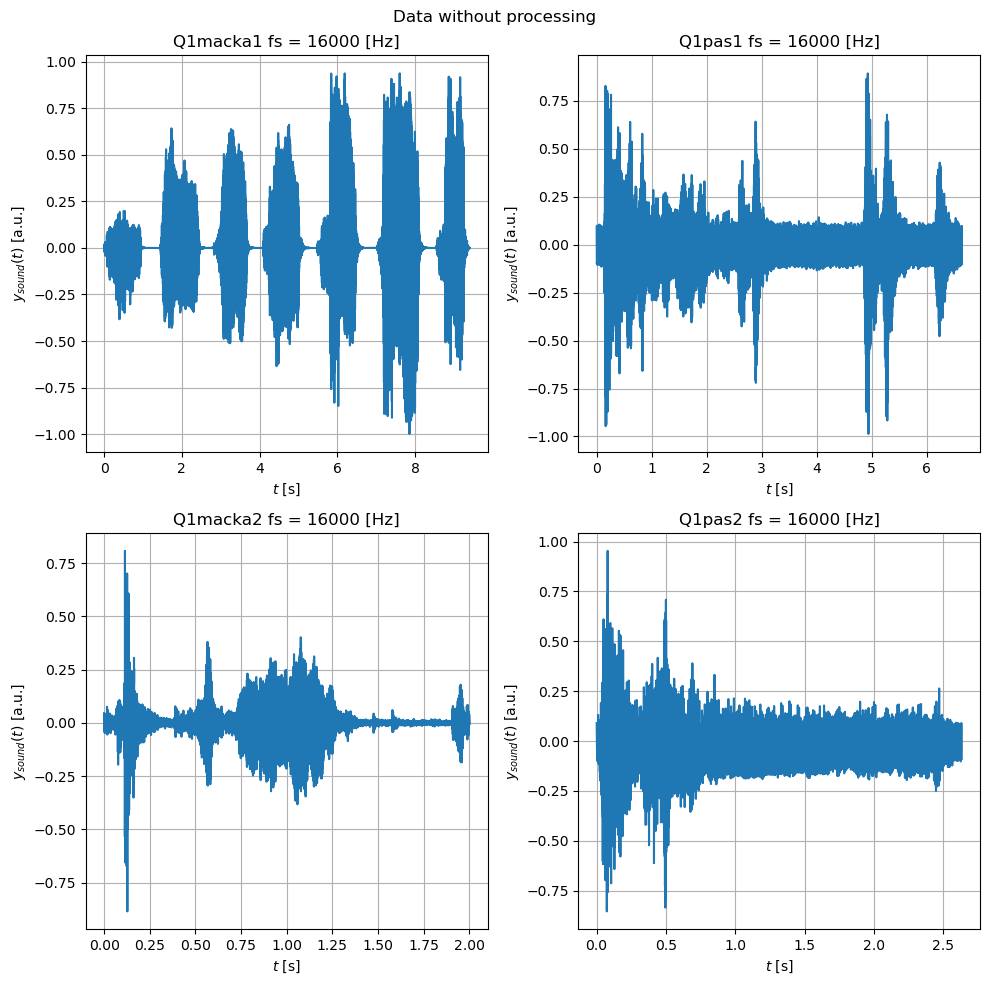

In [5]:
plot_data_time_domain(cat_data, dog_data, "Data without processing")

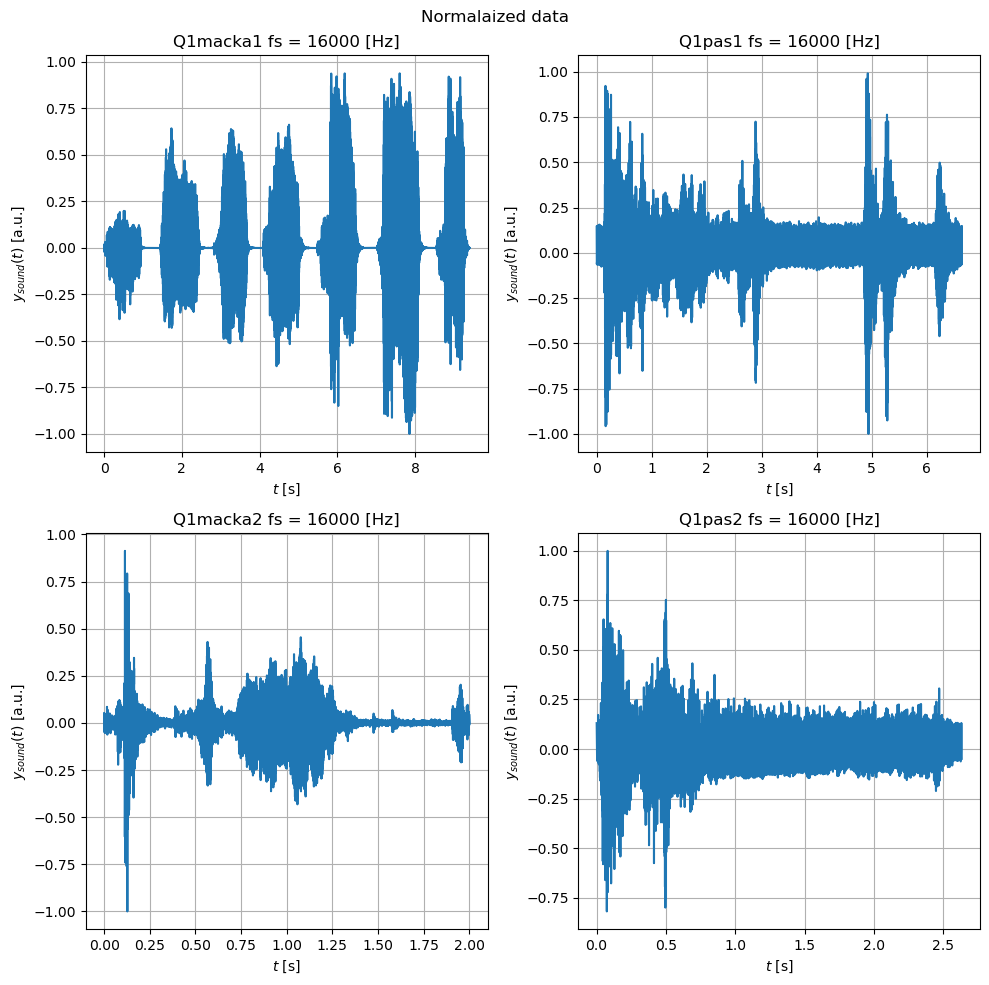

In [6]:
def normalize_data(cat_data, dog_data):
    dictionaries = [cat_data, dog_data]
    
    for idx, dictionary in enumerate(dictionaries):
        
        for key in dictionary:
            y, fs = dictionary[key] 
            y = y - np.mean(y)
            dictionary[key] = (y/np.max(np.abs(y)), fs)
            
        dictionaries[idx] = dictionary
            
    return (*dictionaries, )

cat_data, dog_data = normalize_data(cat_data, dog_data)
plot_data_time_domain(cat_data, dog_data,  "Normalaized data")

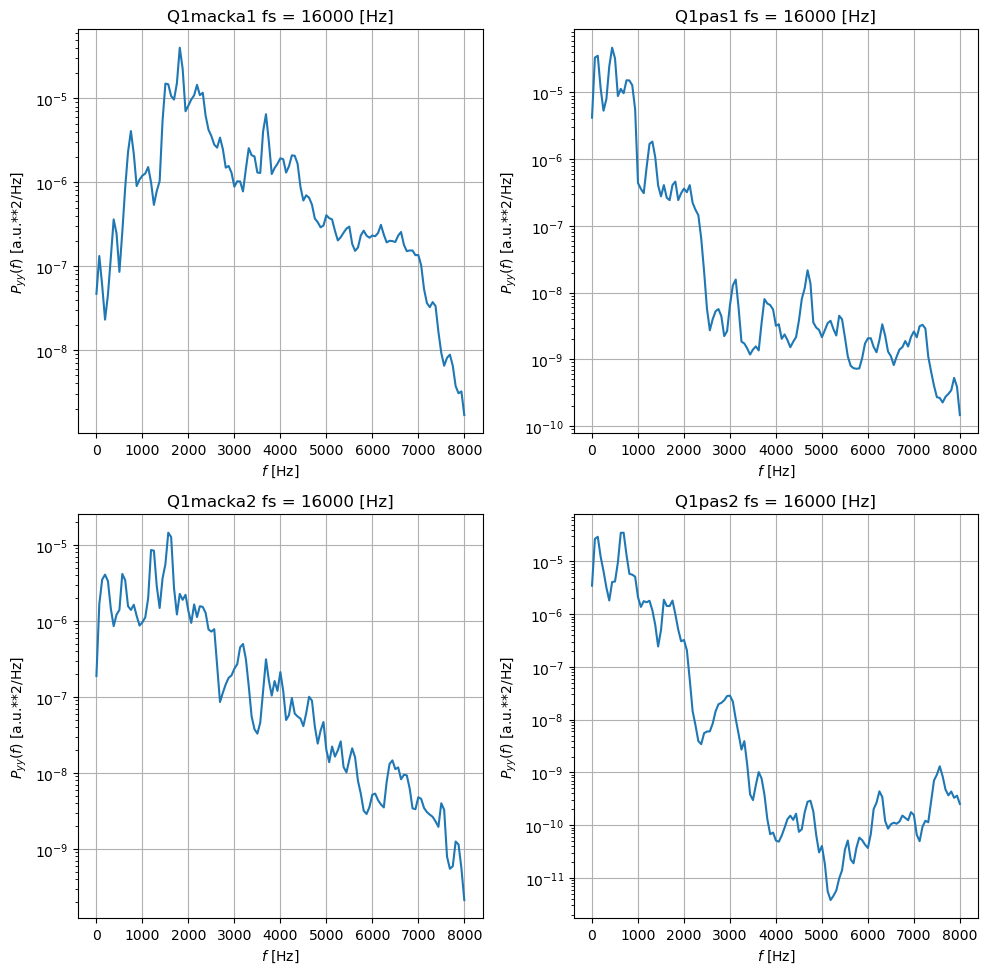

In [7]:
import scipy 

def plot_data_frequency_domain(cat_data, dog_data, title=''):
    
    num_cats = len(cat_data.keys())
    num_dogs = len(dog_data.keys())
    dictionaries = [cat_data, dog_data]
    
    cat_keys = list(cat_data.keys())
    dog_keys = list(dog_data.keys())
    keys = [cat_keys, dog_keys]
    
    fig, axes = plt.subplots(2, int((num_cats+num_dogs)//2), figsize=(10, 5*(num_cats+num_dogs)//2))
    axes = axes.ravel()
    fig.suptitle(title)
    
    for i in range(num_cats + num_dogs):
        
        k = i%2 #if even it's a cat, if odd it's a dog 
        key = keys[k][i//2] # 0 0, 1 1, 2 2, ...
        fs = dictionaries[k][key][1] # key: (y, fs)
        y = dictionaries[k][key][0]
        
        f, Pyy = scipy.signal.welch(y, fs, nperseg=256)
        axes[i].semilogy(f, Pyy)
        axes[i].grid('on')
        axes[i].set_xlabel('$f$ [Hz]')
        axes[i].set_ylabel('$P_{yy}(f)$ [a.u.**2/Hz]')
        axes[i].set_title(key+ f' fs = {fs} [Hz]')
        
    plt.tight_layout()
    plt.show()
    
plot_data_frequency_domain(cat_data, dog_data)

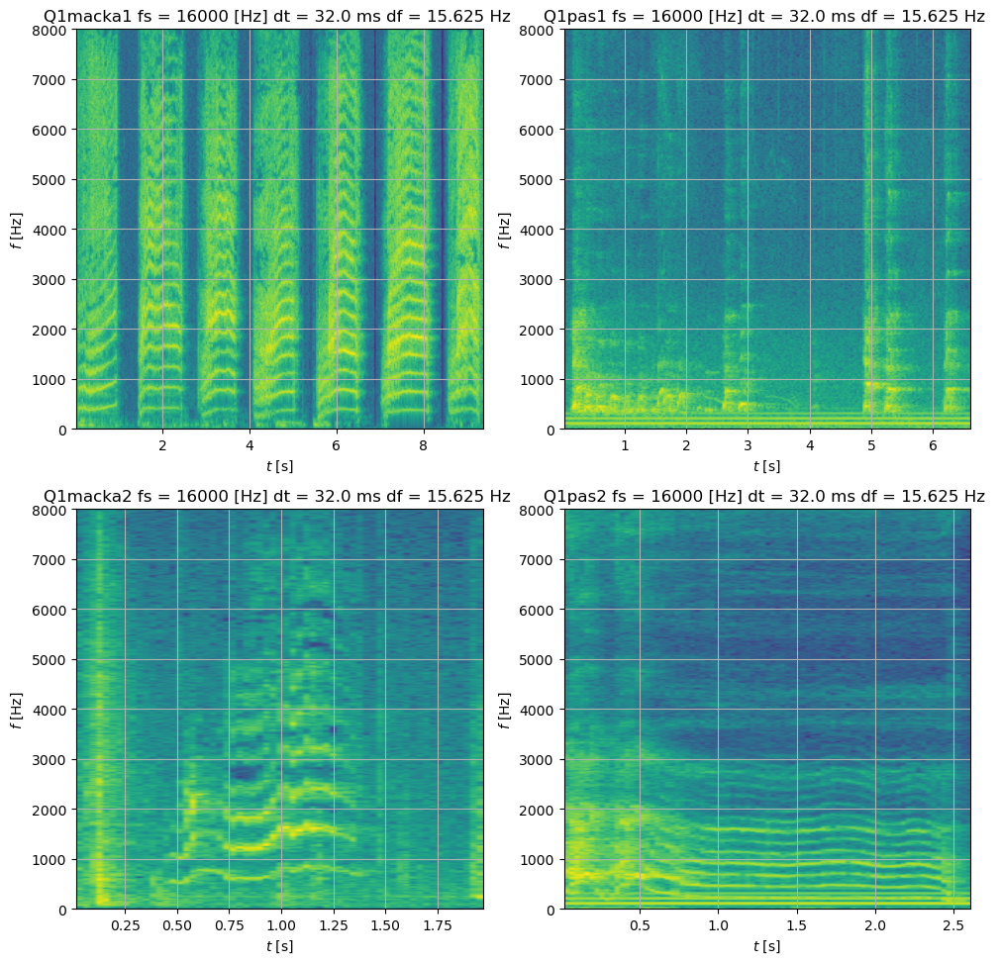

In [8]:
import matplotlib
def plot_data_specgram(cat_data, dog_data,NFFT=256, window=matplotlib.mlab.window_hanning, noverlap=128, title=''):
        
    num_cats = len(cat_data.keys())
    num_dogs = len(dog_data.keys())
    dictionaries = [cat_data, dog_data]
    
    cat_keys = list(cat_data.keys())
    dog_keys = list(dog_data.keys())
    keys = [cat_keys, dog_keys]
    
    fig, axes = plt.subplots(2, int((num_cats+num_dogs)//2), figsize=(10, 5*(num_cats+num_dogs)//2))
    axes = axes.ravel()
    fig.suptitle(title)
    
    for i in range(num_cats + num_dogs):
        
        k = i%2 #if even it's a cat, if odd it's a dog 
        key = keys[k][i//2] # 0 0, 1 1, 2 2, ...
        fs = dictionaries[k][key][1] # key: (y, fs)
        y = dictionaries[k][key][0]
        
        #f, Pyy = scipy.signal.welch(y, fs, nperseg=256)
        axes[i].specgram(x=y, Fs=fs, NFFT=NFFT, window=window, noverlap=noverlap, pad_to=2048)
        axes[i].grid('on')
        axes[i].set_xlabel('$t$ [s]')
        axes[i].set_ylabel('$f$ [Hz]')
        axes[i].set_title(key+ f' fs = {fs} [Hz]' + f" dt = {(NFFT-noverlap)*1000/fs} ms df = {fs/NFFT} Hz ")
        
    plt.tight_layout()
    plt.show()

NFFT = 1024
plot_data_specgram(cat_data, dog_data,NFFT, np.blackman(NFFT), noverlap=512)

C:\Users\milos\Anaconda3\envs\python38\lib\site-packages\matplotlib\axes\_axes.py:7774: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


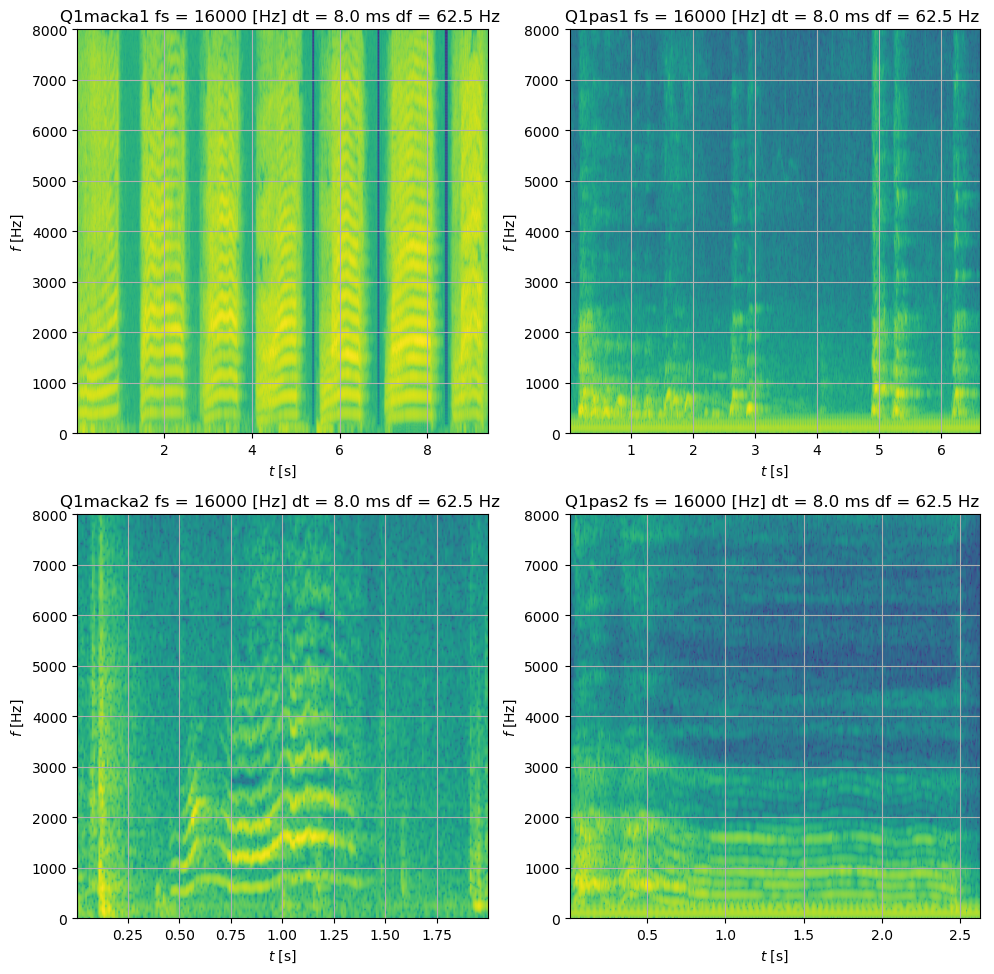

In [9]:
NFFT=256
plot_data_specgram(cat_data, dog_data,NFFT, np.blackman(NFFT), noverlap=NFFT//2)

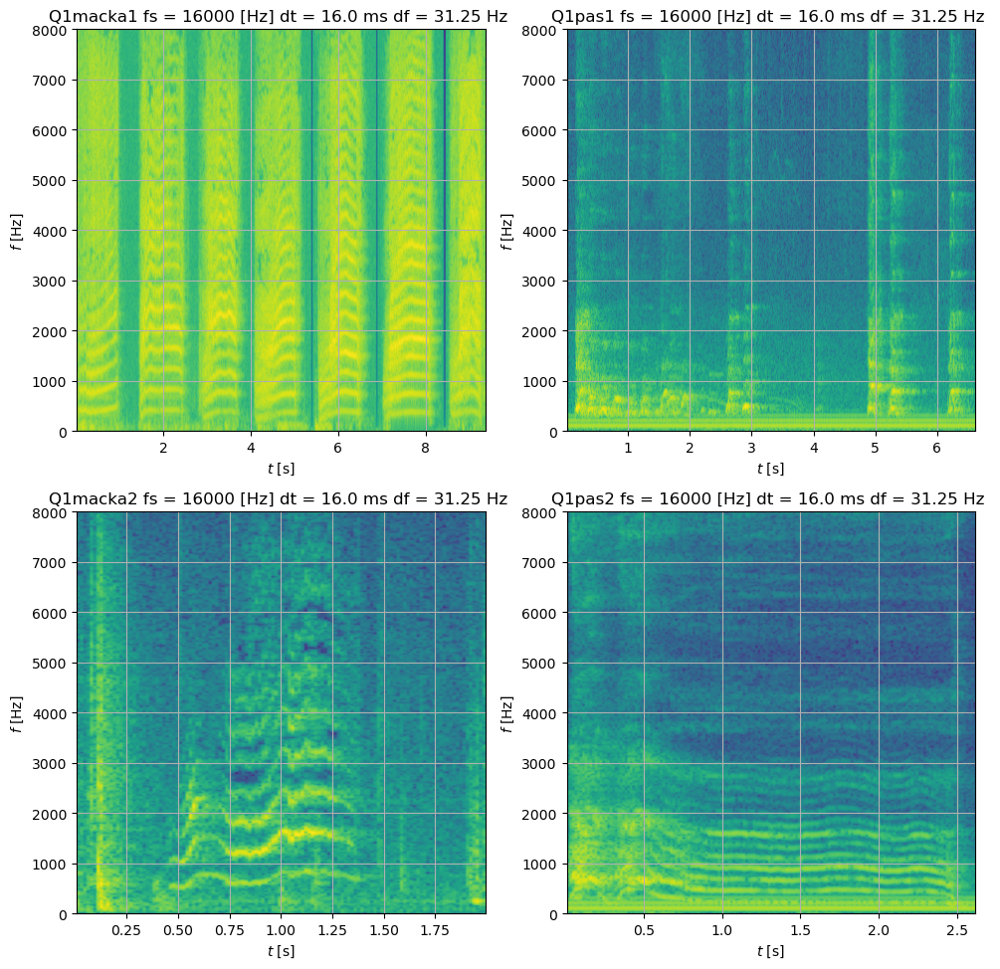

In [10]:
NFFT=512
plot_data_specgram(cat_data, dog_data,NFFT, np.blackman(NFFT), noverlap=NFFT//2)

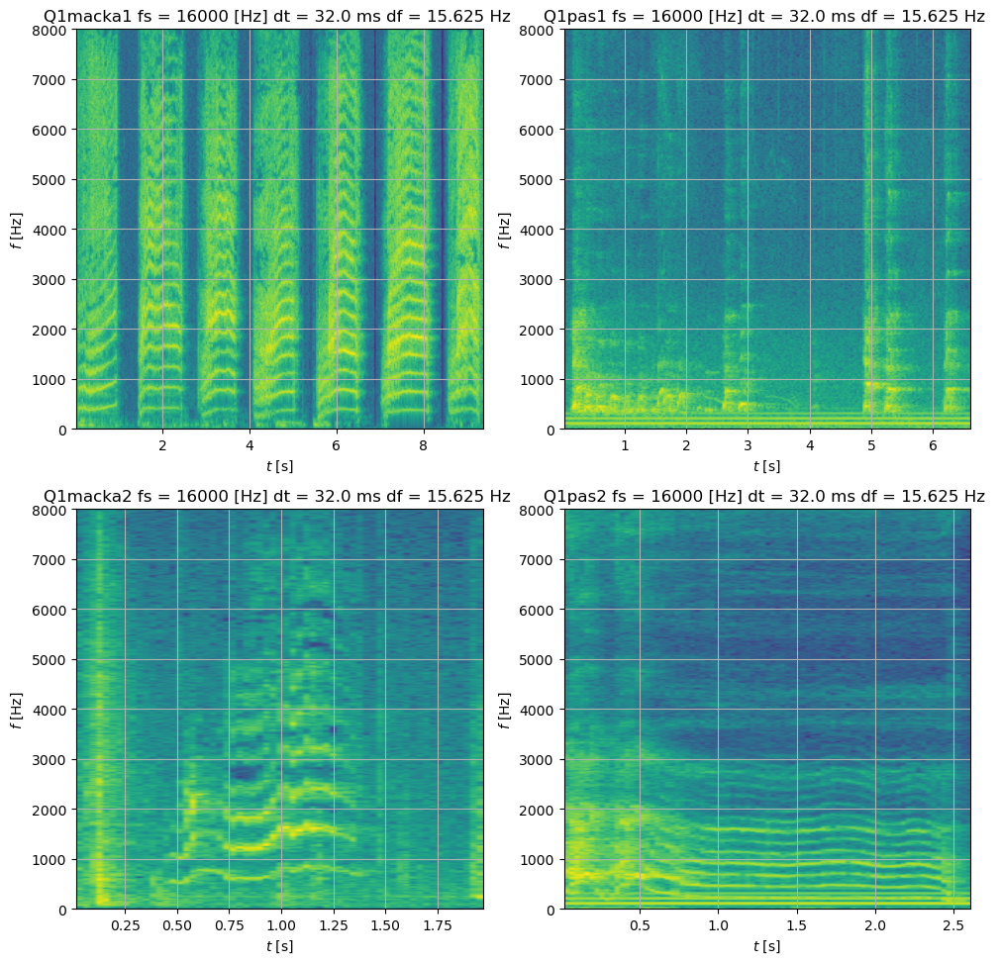

In [11]:
NFFT=1024
plot_data_specgram(cat_data, dog_data,NFFT, np.blackman(NFFT), noverlap=NFFT//2)

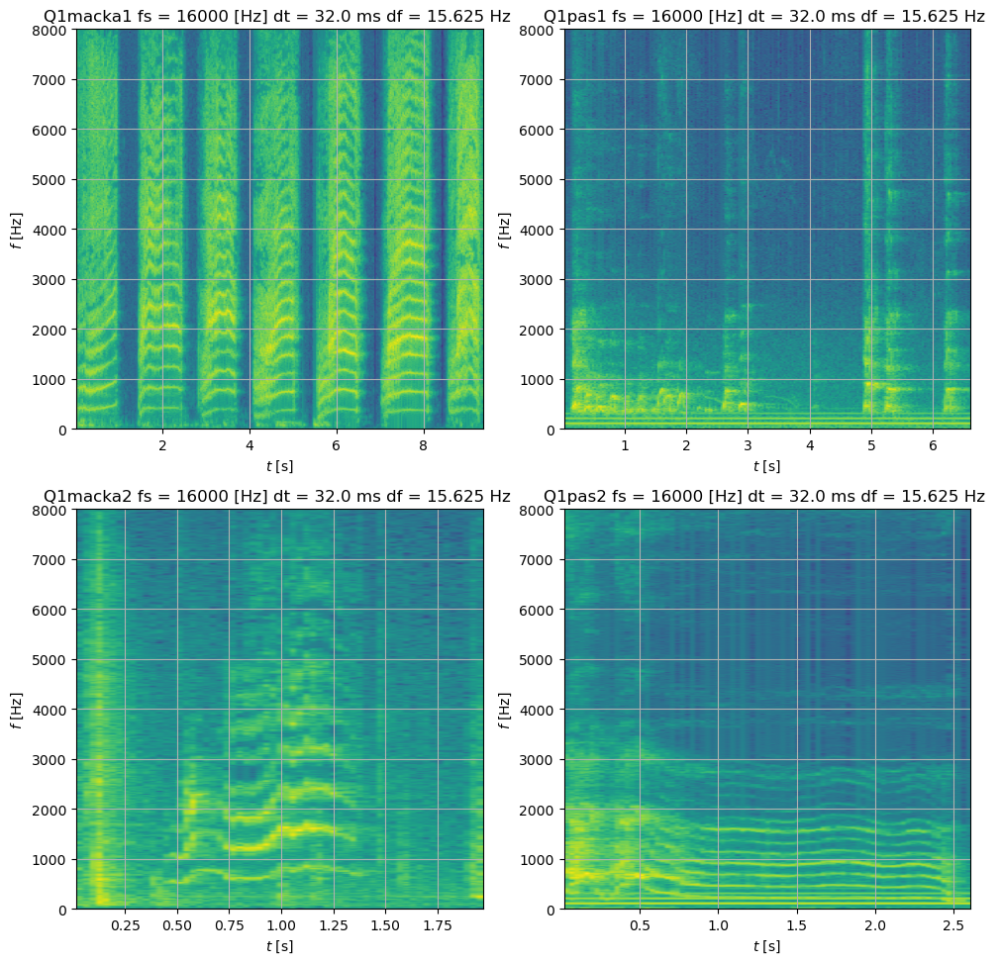

In [12]:
plot_data_specgram(cat_data, dog_data,NFFT, np.hamming(NFFT), noverlap=NFFT//2)

In [13]:
# Filters for noise at 100, 200 and 300 Hz in dog signals

wp = [80, 120]
ws = [90, 110]
gpass = 0.1
gstop = 40
sos100 = scipy.signal.iirdesign(wp, ws, gpass, gstop, analog=False, ftype='butter', output='sos', fs=16000)

wp = [180, 220]
ws = [190, 210] 
gpass = 0.1
gstop = 40
sos200 = scipy.signal.iirdesign(wp, ws, gpass, gstop, analog=False, ftype='butter', output='sos', fs=16000)

wp = [280, 320]
ws = [290, 310]
gpass = 0.1
gstop = 40
sos300 = scipy.signal.iirdesign(wp, ws, gpass, gstop, analog=False, ftype='butter', output='sos', fs=16000)

sos_filt = [sos100, sos200, sos300]

for key in dog_data:
    y, fs = dog_data[key]
    y_filt = y
    for sos in sos_filt:
        y_filt = scipy.signal.sosfilt(sos, y_filt)
    dog_data[key] = (y_filt, fs)

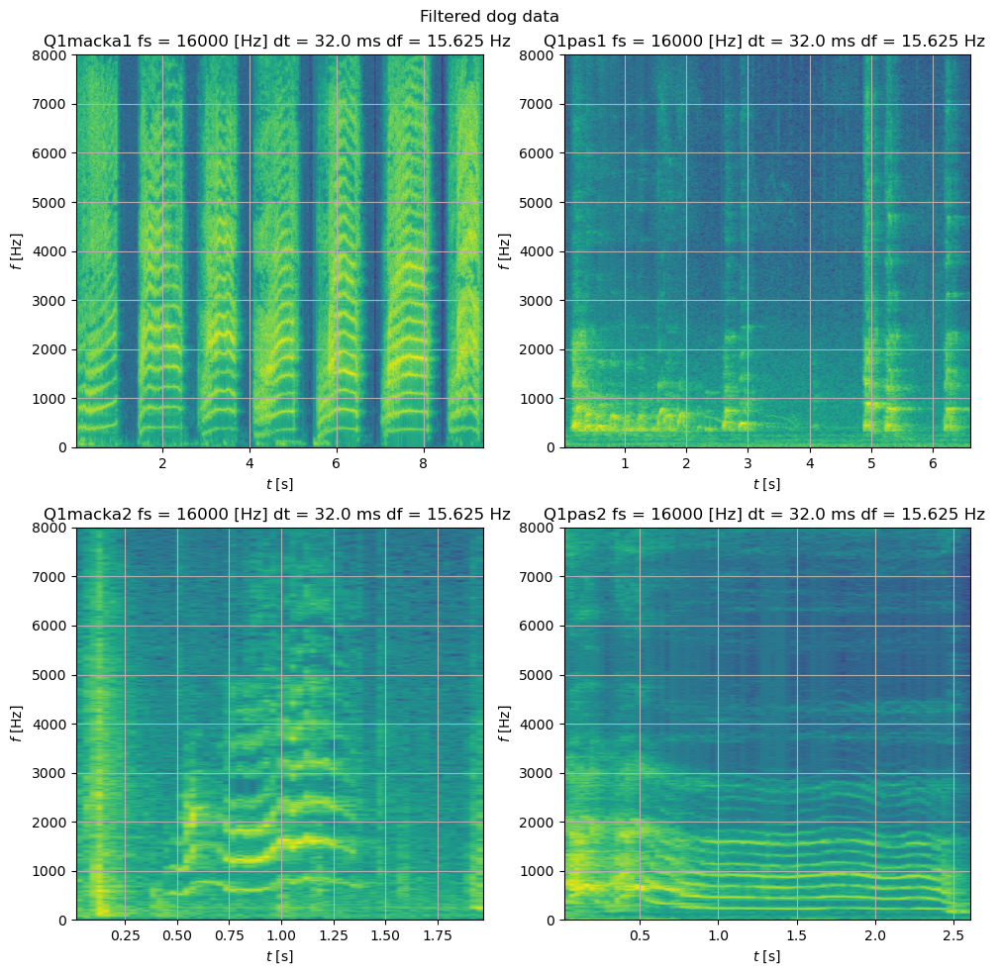

In [14]:
plot_data_specgram(cat_data, dog_data,NFFT, np.hamming(NFFT), noverlap=NFFT//2, title='Filtered dog data')

In [15]:
for key in dog_data:
    y, fs = dog_data[key]
    y_ds = scipy.signal.decimate(y, q=2)
    dog_data[key] = (y_ds, fs//2)
    
for key in cat_data:
    y, fs = cat_data[key]
    y_ds = scipy.signal.decimate(y, q=2)
    cat_data[key] = (y_ds, fs//2)

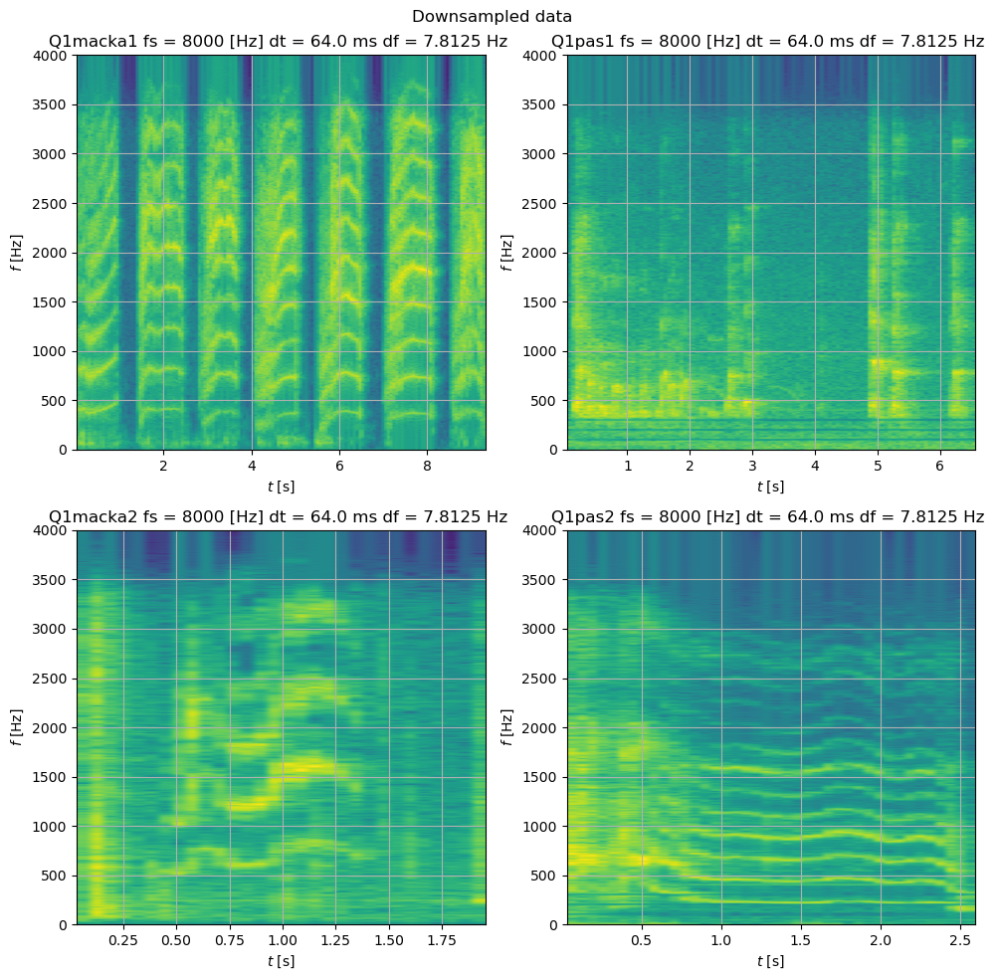

In [16]:
plot_data_specgram(cat_data, dog_data,NFFT, np.hamming(NFFT), noverlap=NFFT//2, title='Downsampled data')

In [35]:

import ssqueezepy


def plot_data_cwt(cat_data, dog_data, scales=np.arange(1, 16), wavelet='gmw', title=''):
    def fmt(ticks):
        if all(isinstance(h, str) for h in ticks):
            return "%s"
        return ("%.d" if all(float(h).is_integer() for h in ticks) else
                "%.2f")
    
    num_cats = len(cat_data.keys())
    num_dogs = len(dog_data.keys())
    dictionaries = [cat_data, dog_data]
    
    cat_keys = list(cat_data.keys())
    dog_keys = list(dog_data.keys())
    keys = [cat_keys, dog_keys]
    
    wavelet = ssqueezepy.Wavelet(wavelet=wavelet)
    plt.figure(figsize=(5, 5))
    wavelet.viz('heatmap')
    #wavelet.viz('waveforms', scale=1)
    
    fig, axes = plt.subplots(2, int((num_cats+num_dogs)//2), figsize=(10, 5*(num_cats+num_dogs)//2))
    axes = axes.ravel()
    fig.suptitle(title)
    
    
    for i in range(num_cats + num_dogs):
        
        k = i%2 #if even it's a cat, if odd it's a dog 
        key = keys[k][i//2] # 0 0, 1 1, 2 2, ...
        fs = dictionaries[k][key][1] # key: (y, fs)
        y = dictionaries[k][key][0]
        #y = y[0:int(fs)]
        t = np.arange(len(y))/fs
        
        Wx, scales = ssqueezepy.cwt(y, wavelet, nv=16, fs=fs)
        freqs_cwt = ssqueezepy.experimental.scale_to_freq(scales, wavelet, len(y), fs=fs)
        #coefficients, frequencies = pywt.cwt(y, scales=np.arange(1, 16), wavelet="morl",
        #                                    sampling_period=1/fs,)
        axes[i].imshow(np.abs(Wx),  aspect='auto')
        
        idxs = np.linspace(0, len(freqs_cwt) - 1, 8).astype('int32')
        yt = [fmt(freqs_cwt) % h for h in np.asarray(freqs_cwt)[idxs]] 
        for idx, freq_idx in enumerate(idxs):
            yt[idx] += ', ' + str(np.round(scales[freq_idx], 1))
            
        axes[i].set_yticks(idxs)
        axes[i].set_yticklabels(yt)
        
        idxs = np.linspace(0, len(t) - 1, 8).astype('int32')
        xt = [fmt(t) % h for h in np.asarray(t)[idxs]]
        axes[i].set_xticks(idxs)
        axes[i].set_xticklabels(xt)
        #axes[i].set_yticks(scales[::10])
        #axes[i].set_xticks(t)
        axes[i].grid('on')
        axes[i].set_xlabel('$t$ [s]')
        axes[i].set_ylabel('$f$ [Hz], scale')
        axes[i].set_title(key+ f' fs = {fs} [Hz]')
        
        
    plt.tight_layout()
    plt.show()
    

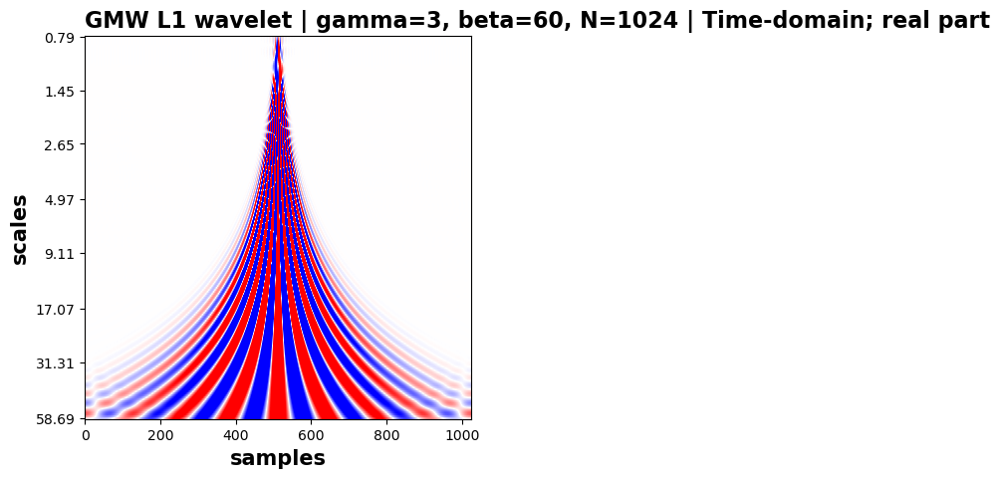

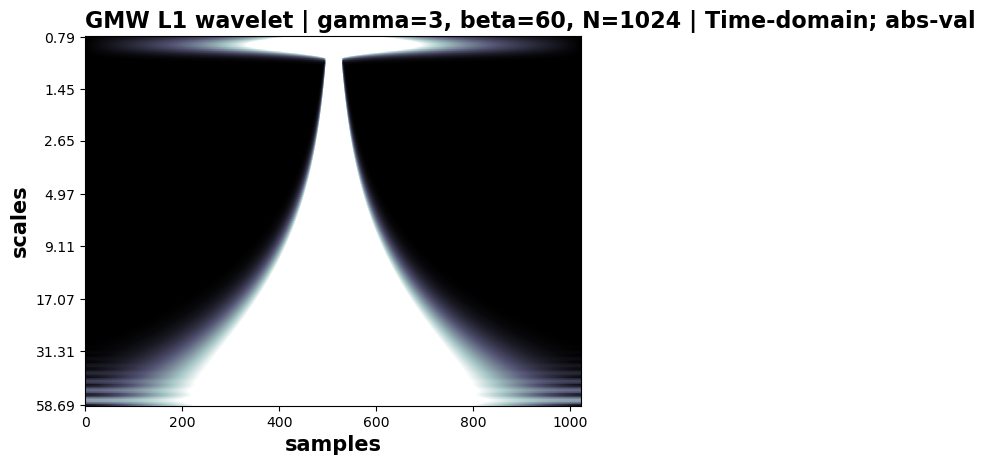

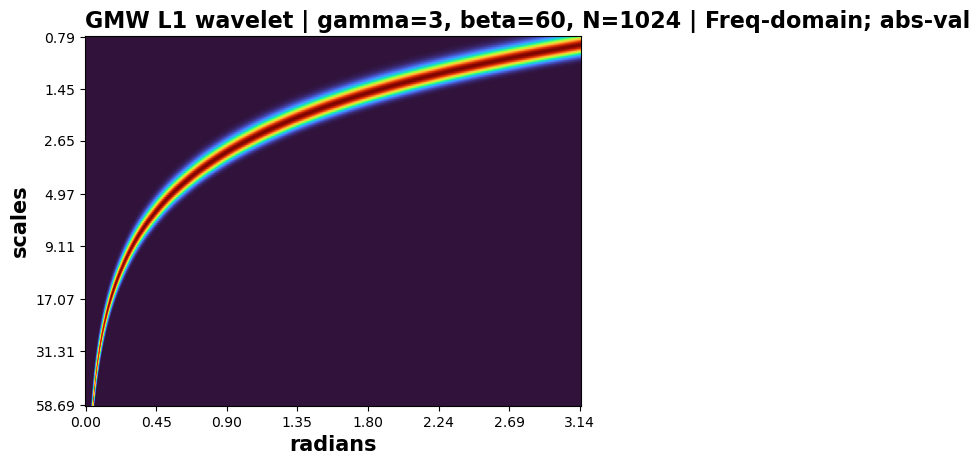

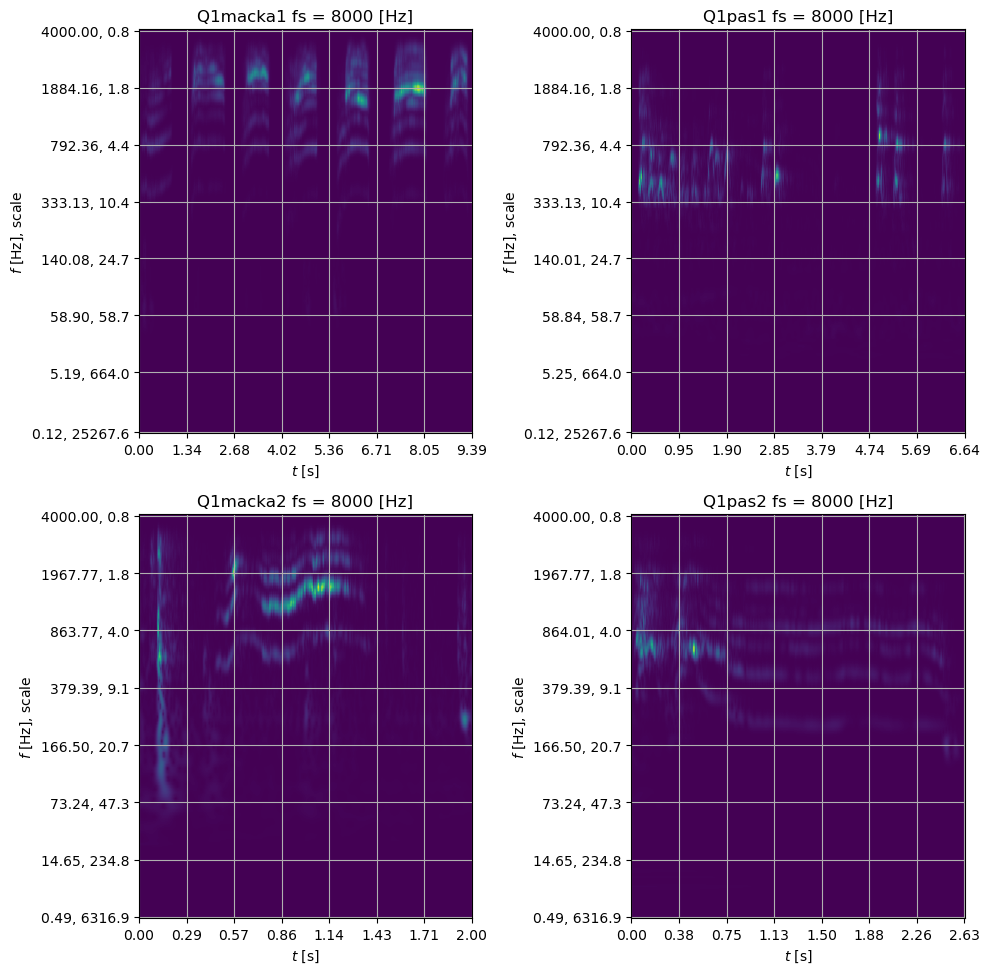

In [36]:
plot_data_cwt(cat_data, dog_data, wavelet='gmw')

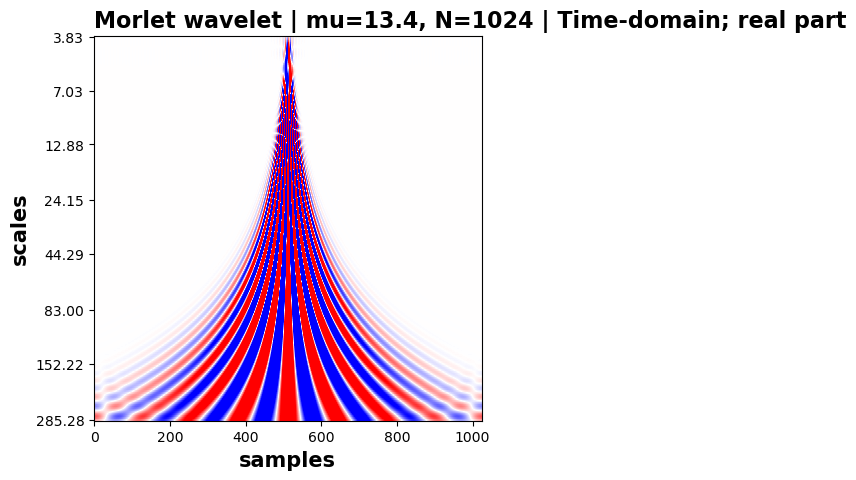

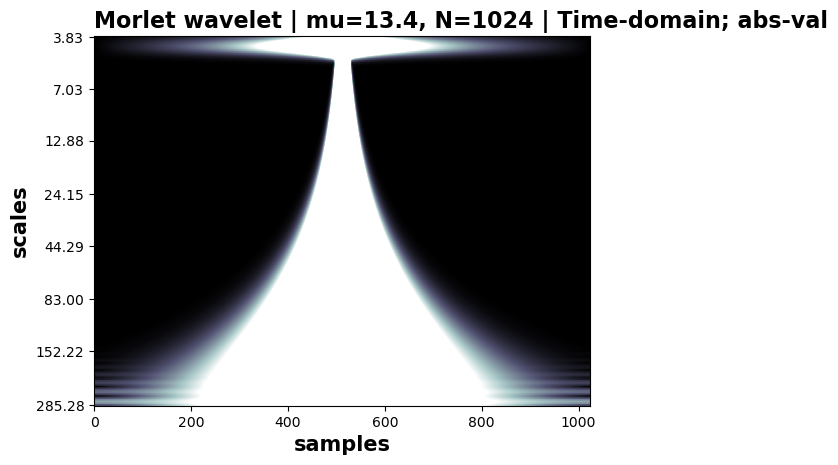

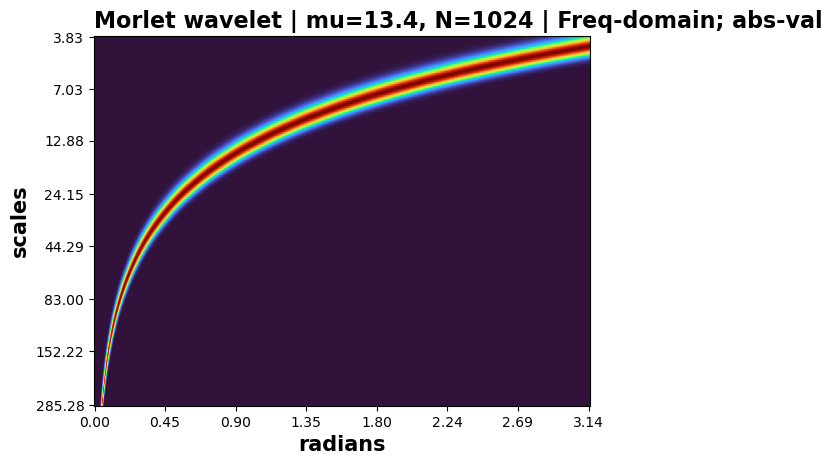

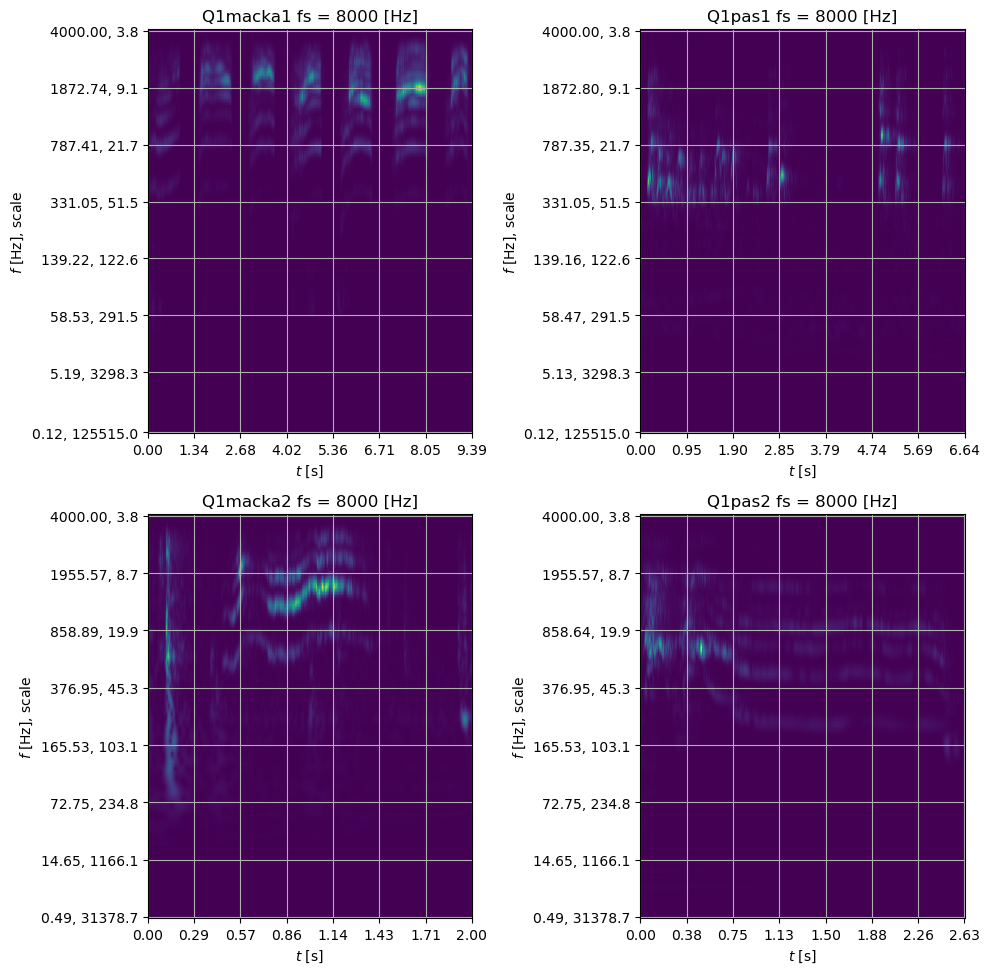

In [37]:
plot_data_cwt(cat_data, dog_data, wavelet='morlet')

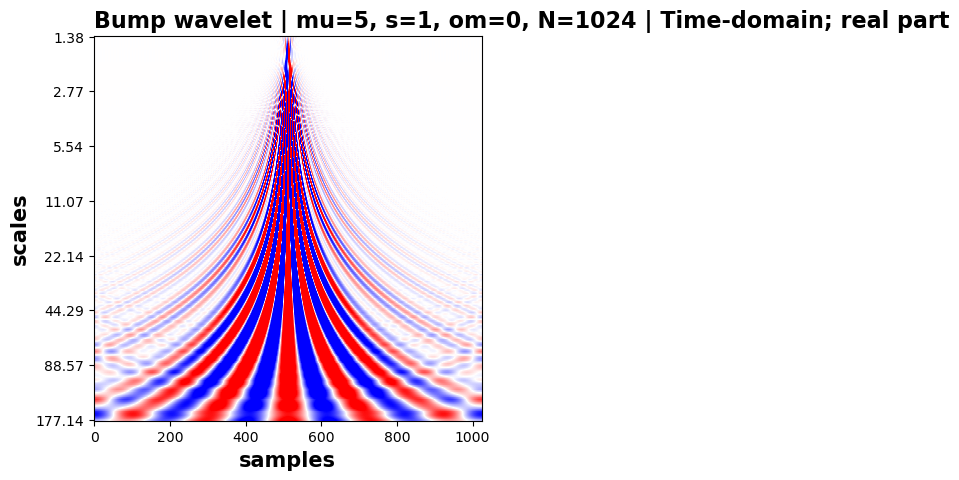

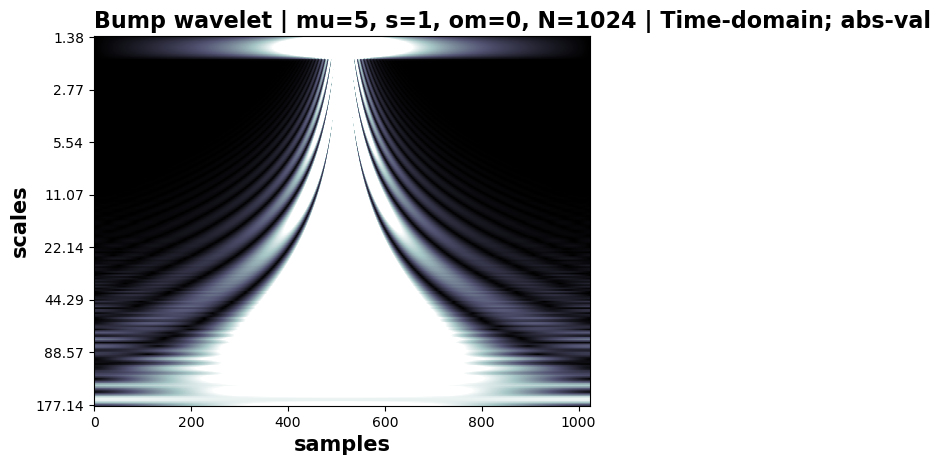

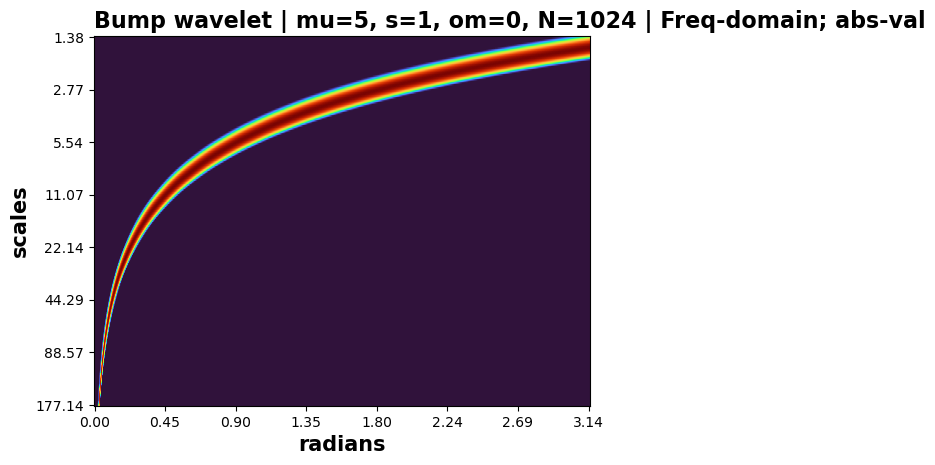

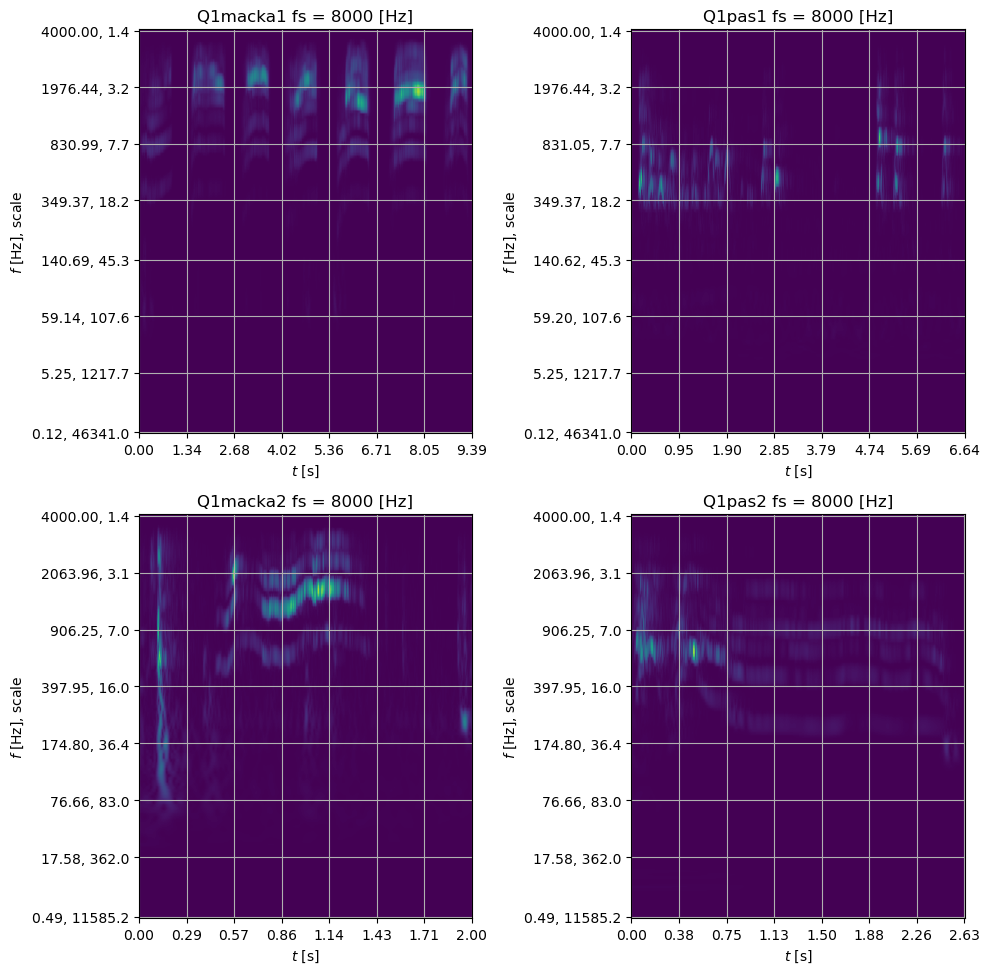

In [38]:
plot_data_cwt(cat_data, dog_data, wavelet='bump')

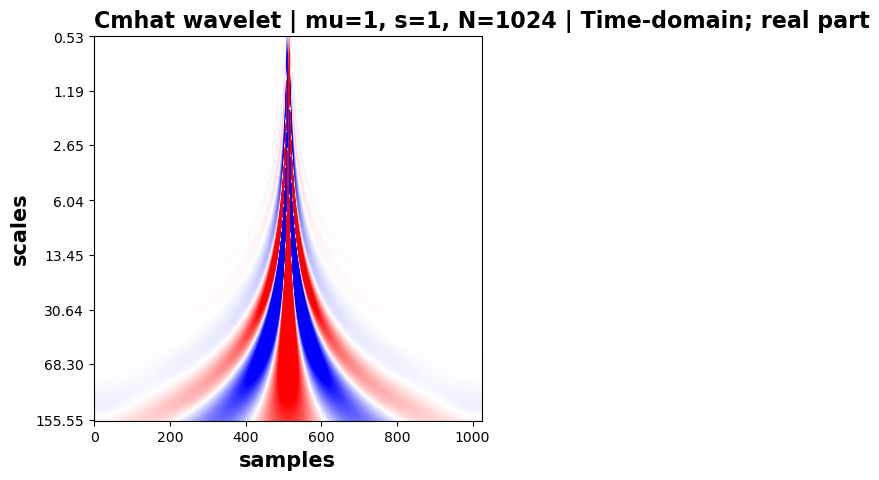

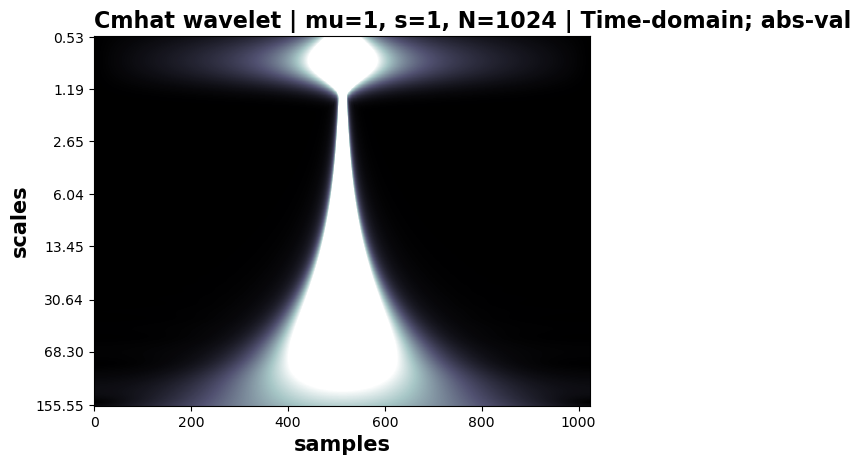

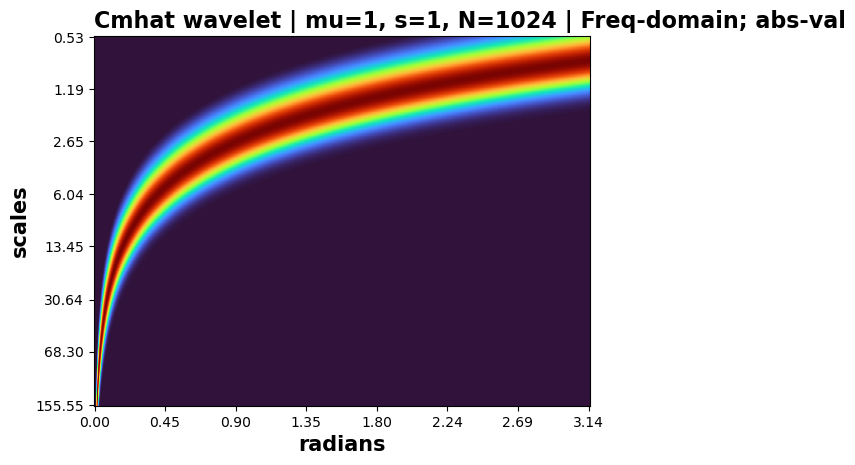

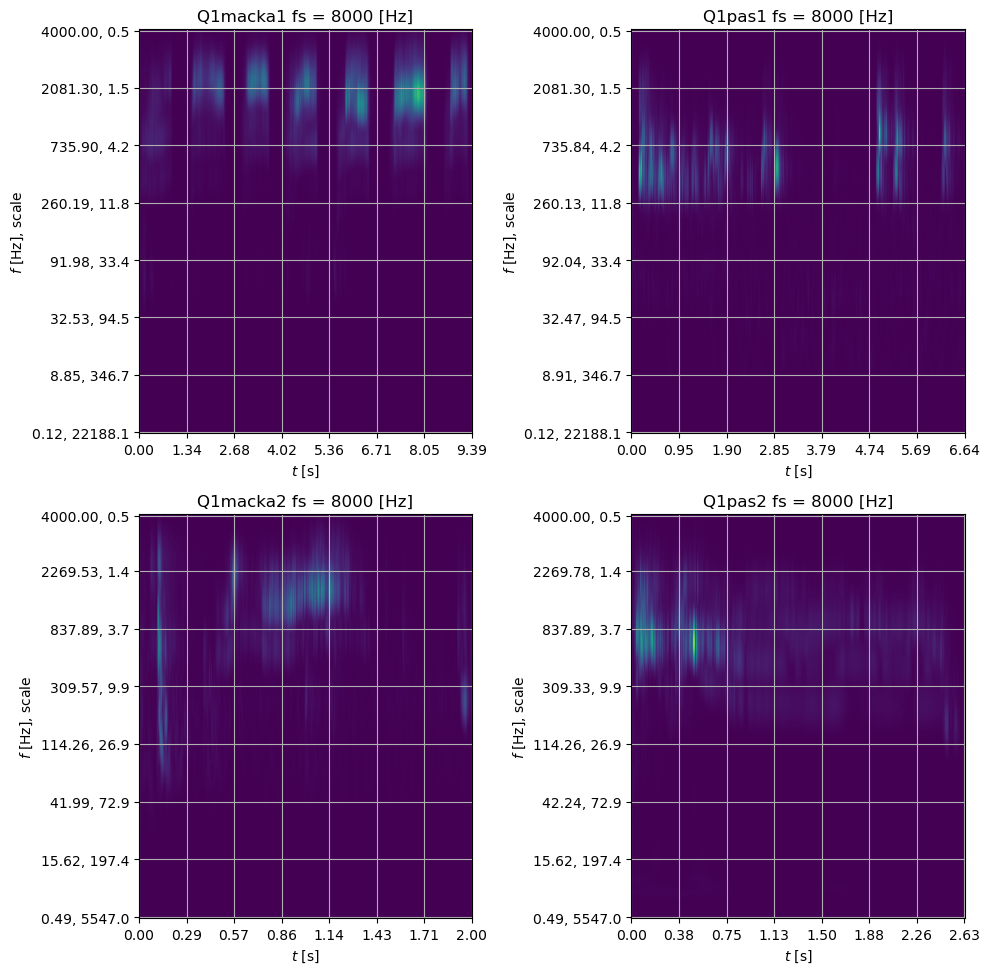

In [39]:
plot_data_cwt(cat_data, dog_data, wavelet='cmhat')

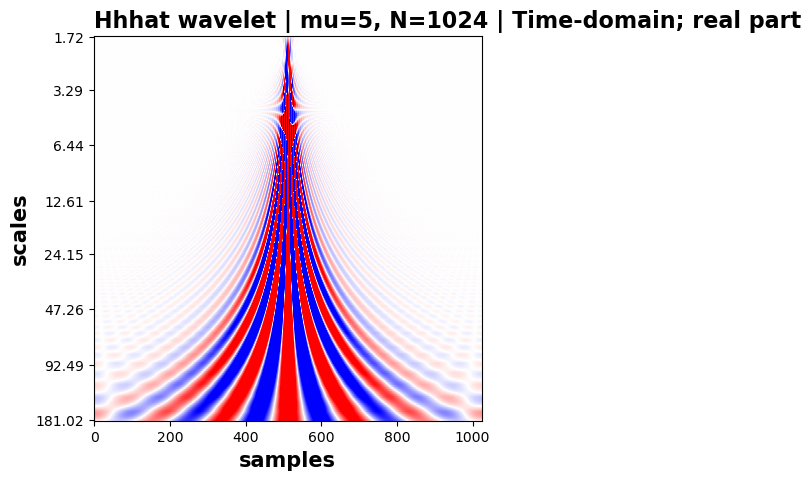

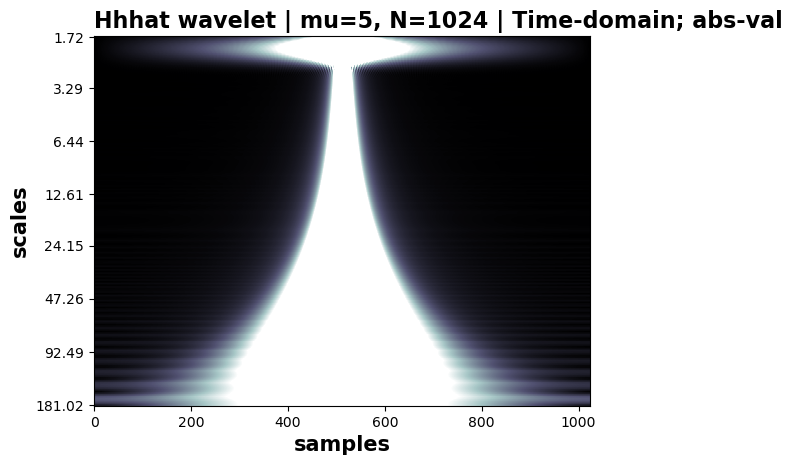

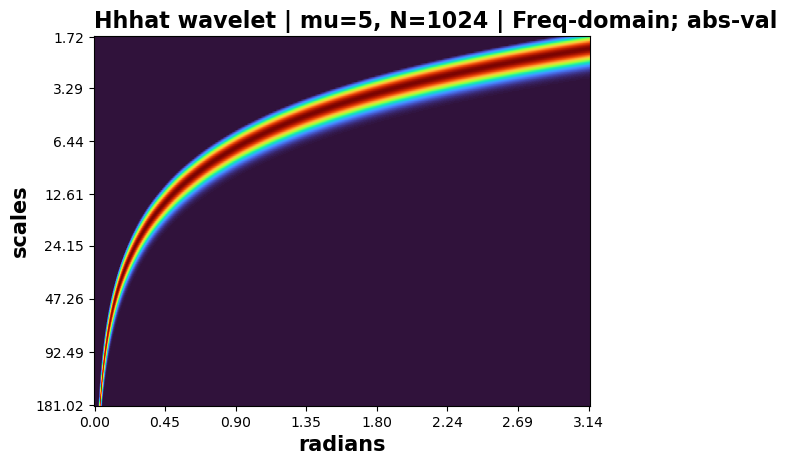

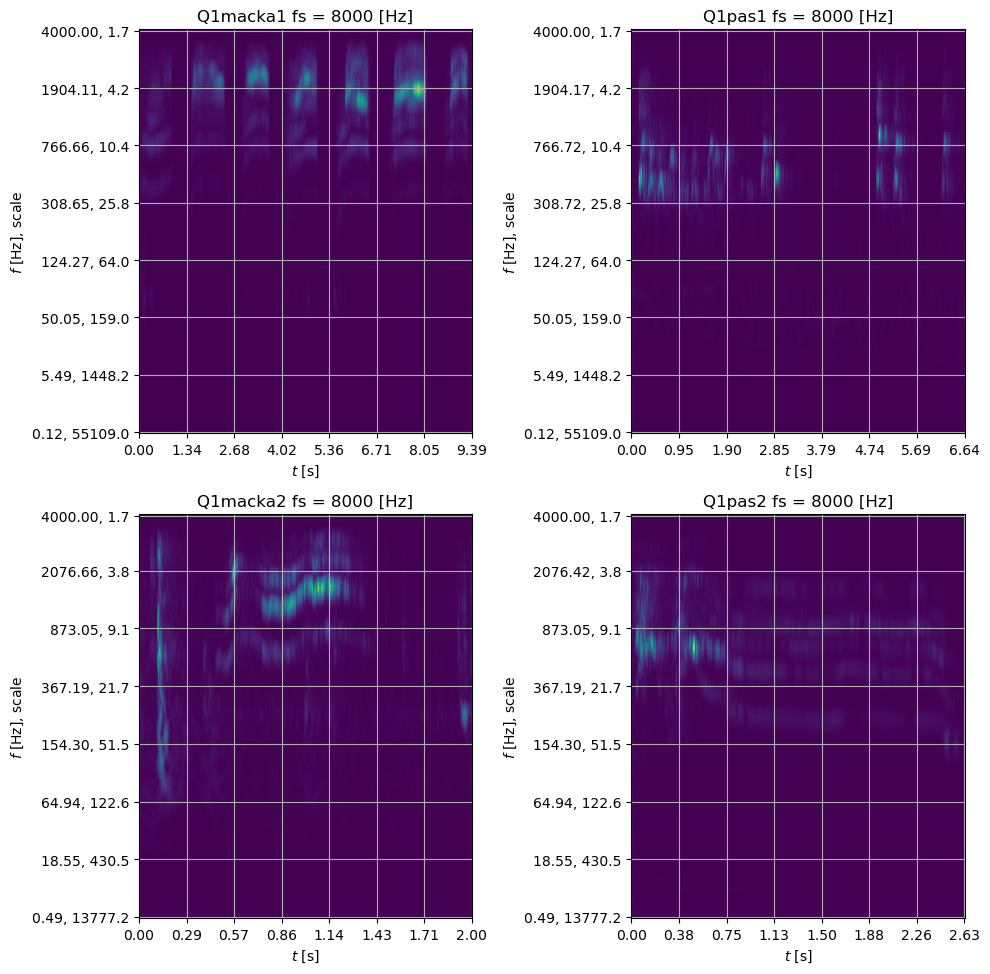

In [40]:
plot_data_cwt(cat_data, dog_data, wavelet='hhhat')

In [41]:
# morlet deluje najbolje, ima unformnu granicu za sve snimke

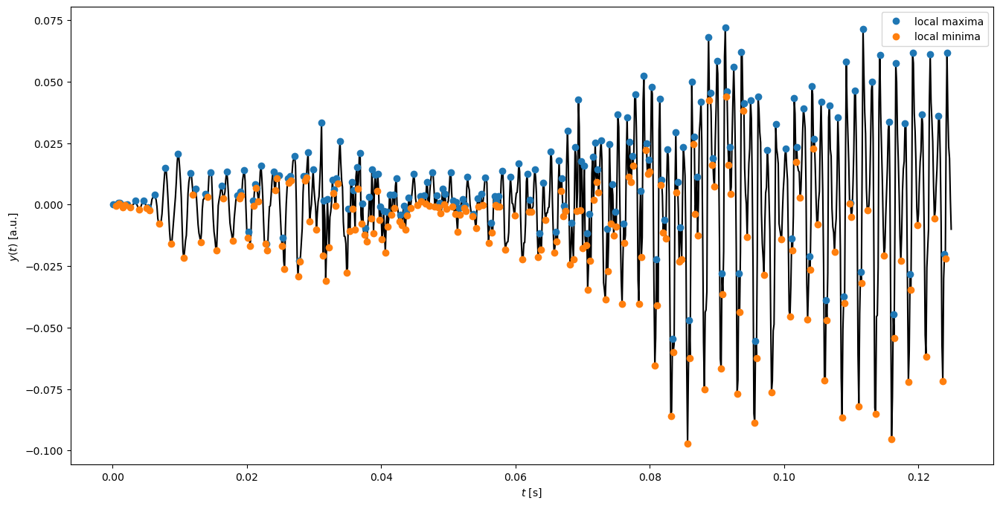

In [49]:
import emd


cat_example, fs = cat_data["Q1macka1"]


peak_locs, peak_mags = emd.sift.get_padded_extrema(cat_example, pad_width=0, mode='peaks')
trough_locs, trough_mags = emd.sift.get_padded_extrema(cat_example, pad_width=0, mode='troughs')

plt.figure(figsize=(16, 8))
t = np.arange(0, len(cat_example))/fs

num_samples = 1000

plt.plot(t[0:num_samples], cat_example[0:num_samples], 'k')
plt.plot(peak_locs[peak_locs<num_samples]/fs, peak_mags[peak_locs<num_samples], 'o', label='local maxima')
plt.plot(trough_locs[trough_locs<num_samples]/fs, trough_mags[trough_locs<num_samples], 'o', label='local minima')

plt.legend()
plt.xlabel('$t$ [s]')
plt.ylabel('$y(t)$ [a.u.]')

plt.show()

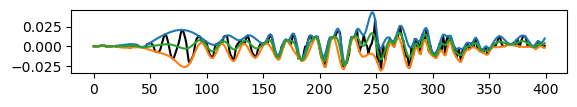

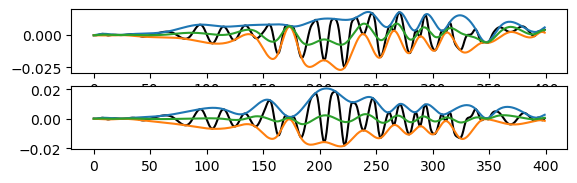

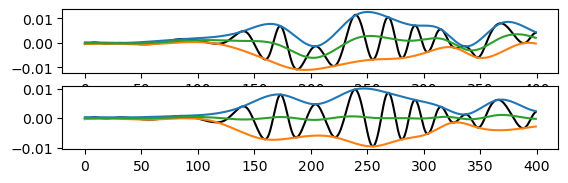

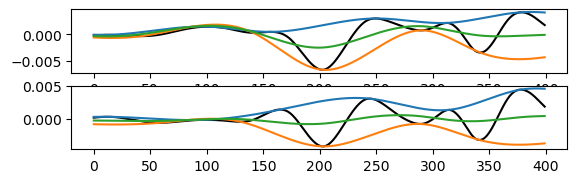

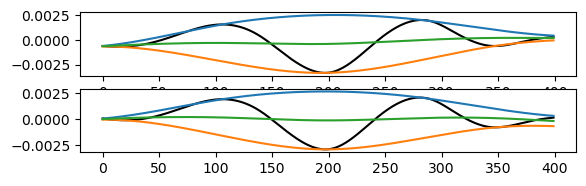

In [61]:
def get_next_imf(x, zoom=None, sd_thresh=0.1):

    proto_imf = x.copy()  # Take a copy of the input so we don't overwrite anything
    continue_sift = True  # Define a flag indicating whether we should continue sifting
    niters = 0            # An iteration counter

    if zoom is None:
        zoom = (0, x.shape[0])
    plt.figure()
    # Main loop - we don't know how many iterations we'll need so we use a ``while`` loop
    while continue_sift:
        niters += 1  # Increment the counter

        # Compute upper and lower envelopes
        upper_env = emd.sift.interp_envelope(proto_imf, mode='upper')
        lower_env = emd.sift.interp_envelope(proto_imf, mode='lower')

        # Compute average envelope
        avg_env = (upper_env+lower_env) / 2

        # Add a summary subplot
        plt.subplot(5, 1, niters)
        plt.plot(proto_imf[zoom[0]:zoom[1]], 'k')
        plt.plot(upper_env[zoom[0]:zoom[1]])
        plt.plot(lower_env[zoom[0]:zoom[1]])
        plt.plot(avg_env[zoom[0]:zoom[1]])

        # Should we stop sifting?
        stop, val = emd.sift.sd_stop(proto_imf-avg_env, proto_imf, sd=sd_thresh)

        # Remove envelope from proto IMF
        proto_imf = proto_imf - avg_env

        # and finally, stop if we're stopping
        if stop:
            continue_sift = False

    # Return extracted IMF
    return proto_imf
num_samples=400
proto_imf = cat_example
for i in range(5):
    new_proto_imf = get_next_imf(proto_imf, [0, num_samples])
    #plt.title(f'IMF_{i+1}')
    proto_imf = proto_imf-new_proto_imf


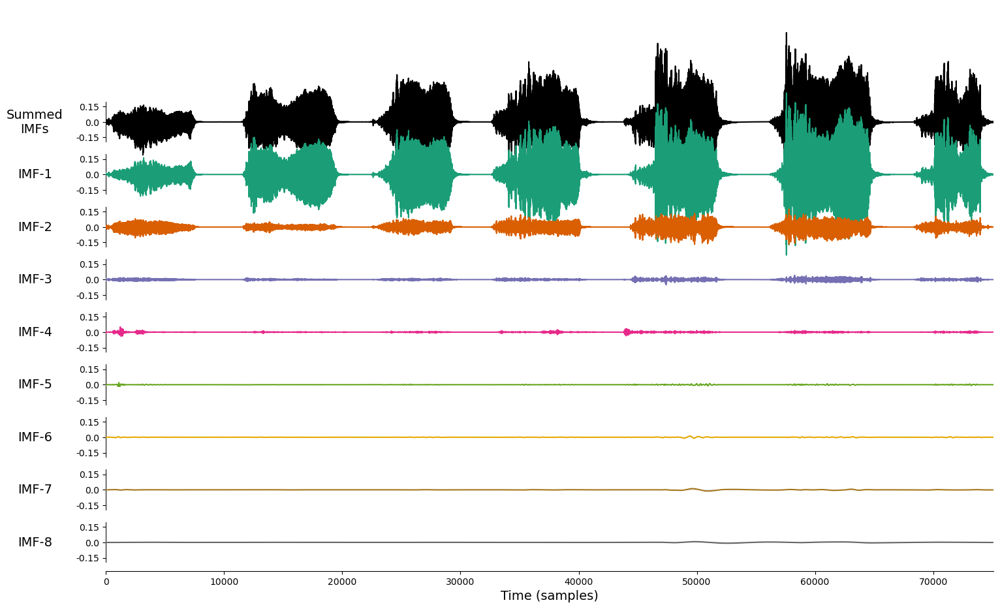

In [88]:
imf = emd.sift.iterated_mask_sift(cat_example, sample_rate=8000, max_imfs=8)
emd.plotting.plot_imfs(imf)
plt.show()

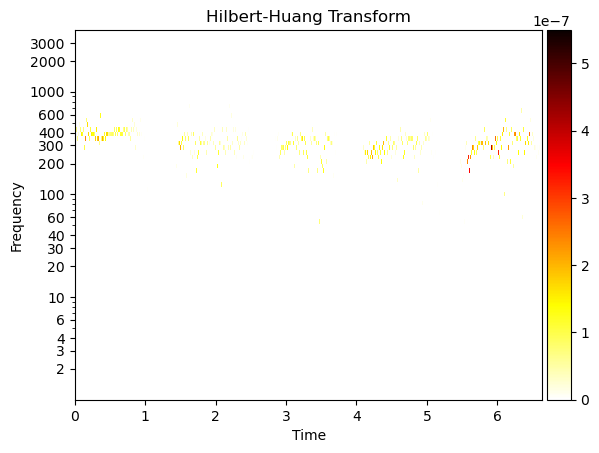

In [101]:
sample_rate=8000
freq_edges, freq_centres = emd.spectra.define_hist_bins(1, sample_rate//2, 80, 'log')
IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'nht')
f, hht = emd.spectra.hilberthuang(IF[:, 2], IA[:, 2], freq_edges, mode='amplitude', sum_time=False, scaling='spectrum')

time_centres = (np.arange(len(cat_example))-.5)/sample_rate


emd.plotting.plot_hilberthuang(hht,  time_centres, freq_centres, time_lims=(0, len(dog_example)/sample_rate),  log_y=True)

plt.show()

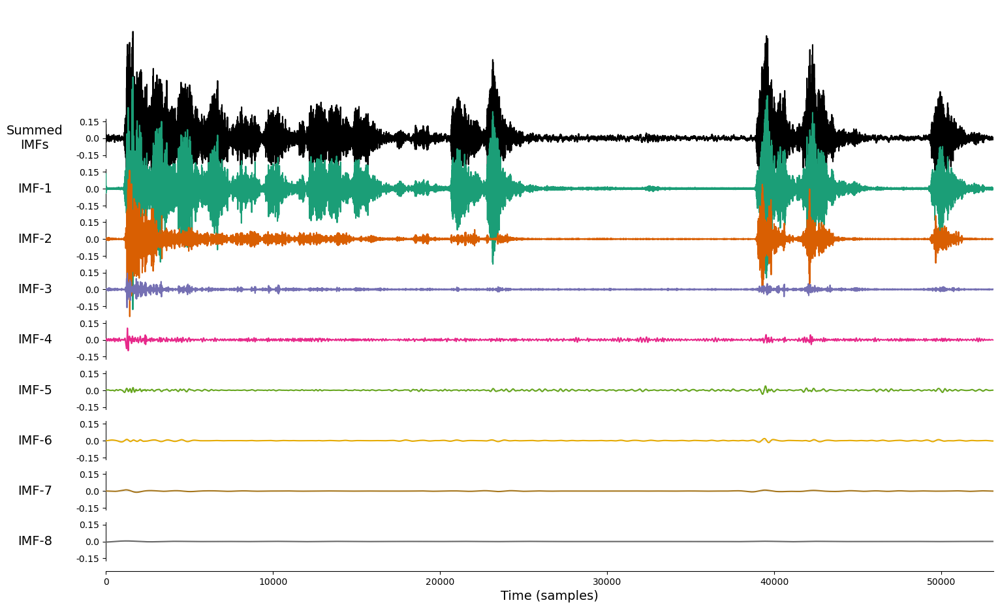

In [102]:
dog_example = dog_data['Q1pas1'][0]
imf = emd.sift.iterated_mask_sift(dog_example, sample_rate=8000, max_imfs=8)
emd.plotting.plot_imfs(imf)
plt.show()

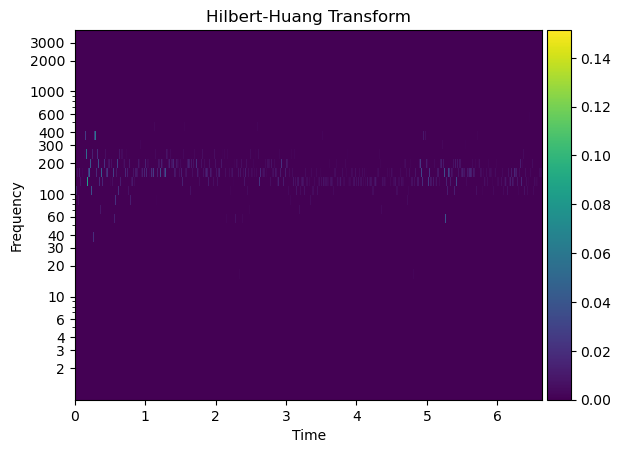

In [103]:
sample_rate=8000
freq_edges, freq_centres = emd.spectra.define_hist_bins(1, sample_rate//2, 40, 'log')
IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'nht')
f, hht = emd.spectra.hilberthuang(IF[:, 2], IA[:, 2], freq_edges, mode='amplitude', sum_time=False)

time_centres = (np.arange(len(dog_example))-.5)/sample_rate


emd.plotting.plot_hilberthuang(hht,  time_centres, freq_centres,
                               cmap='viridis', time_lims=(0, len(dog_example)/sample_rate),  log_y=True)

plt.show()